<a href="https://colab.research.google.com/github/eray0zer/is-that-santa/blob/main/IsThatSanta_proje.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

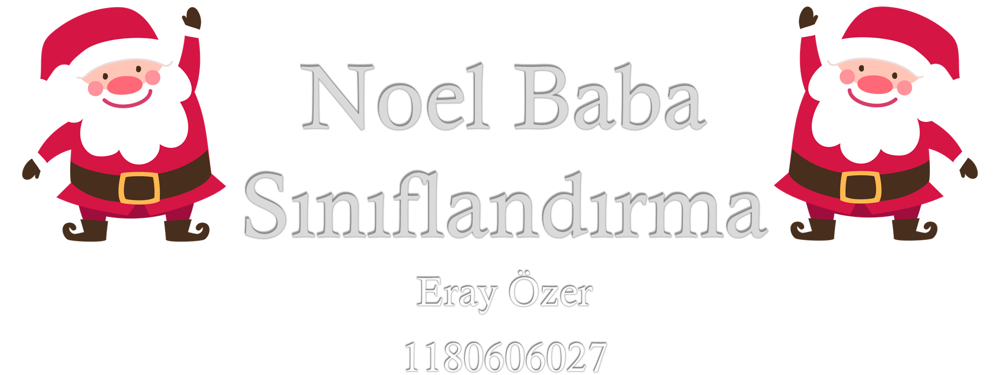



---


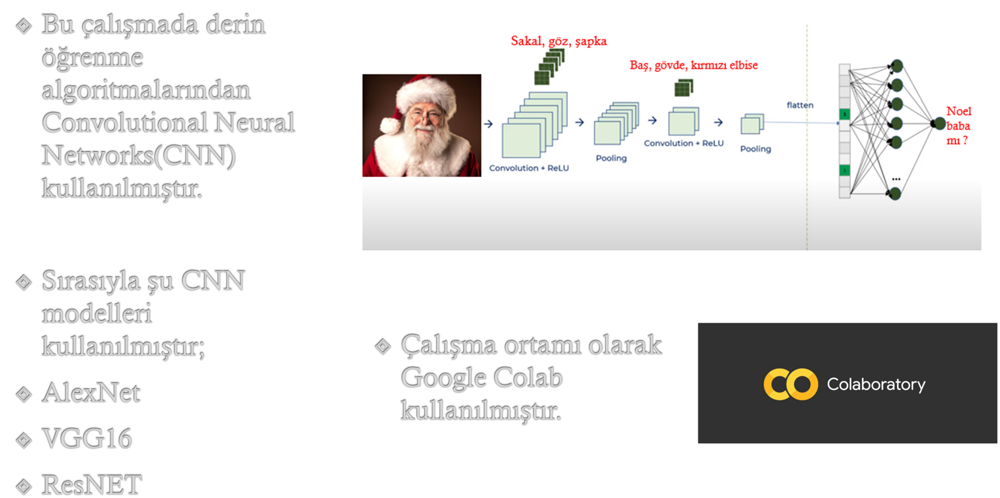



---


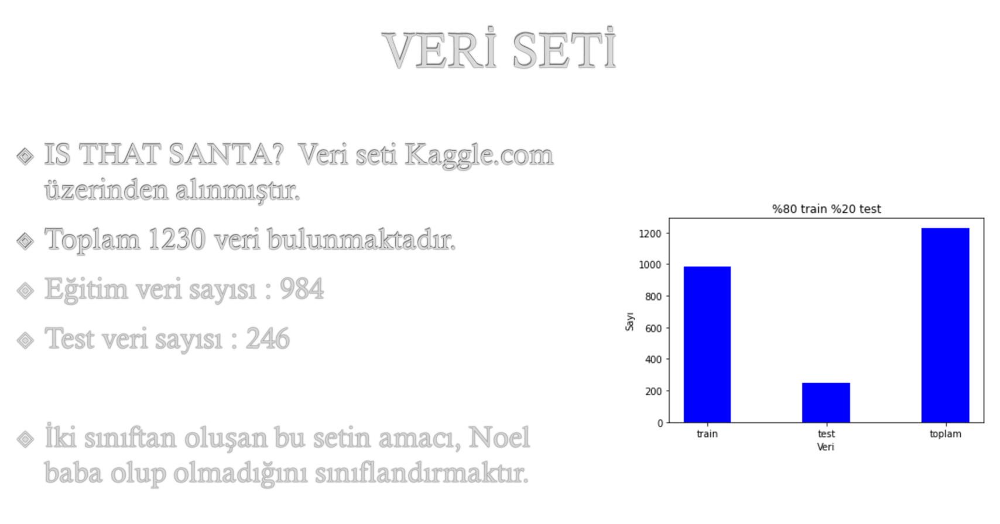



---

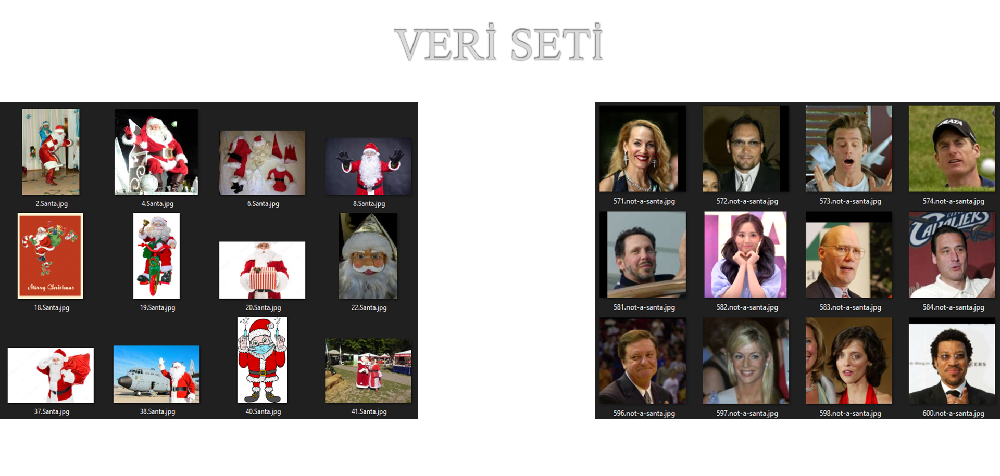



---

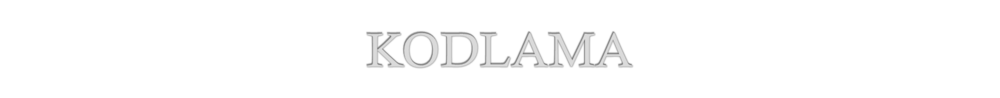
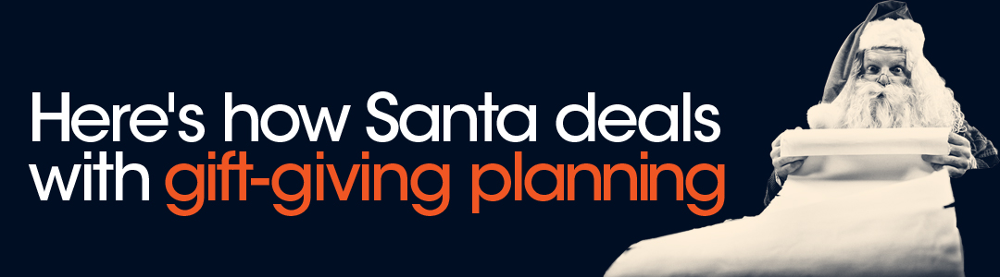




## 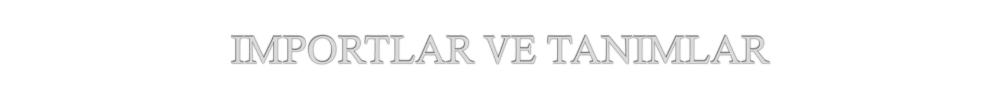

Burada drive bağlantısı ve kütüphaneleri yükleme işlemlerini gerçekleştirdim.

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
import os
import numpy as np 
import pandas as pd 
import cv2

import seaborn as sns
import matplotlib.pyplot as plt
import random

from sklearn.metrics import classification_report, confusion_matrix

import tensorflow as tf
from tensorflow.keras.utils import plot_model
from tensorflow.keras.utils import to_categorical
from keras.preprocessing.image import load_img, img_to_array
from keras.preprocessing.image import ImageDataGenerator

from keras.models import Sequential
from tensorflow.keras.optimizers import Adam

from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Dropout, Flatten, Activation, Dense

In [ ]:
!unzip "/content/drive/MyDrive/isSanta.zip"

In [ ]:
print("Tensorflow version " + tf.__version__)

device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
    print('GPU device not found - On for CPU time!')
else:
    print('Found GPU at {}'.format(device_name))

Tensorflow version 2.8.2
Found GPU at /device:GPU:0




## 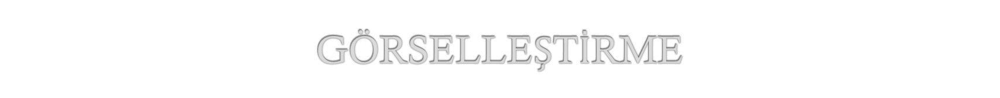

In [ ]:
train_path = '/content/is that santa/train'
test_path = '/content/is that santa/test'

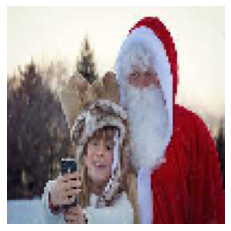

In [ ]:
img = load_img(train_path + "/santa/68.Santa.jpg", target_size=(100,100))
plt.imshow(img)
plt.axis("off")
plt.show()

In [ ]:
IMAGE_SIZE = 150,150
CLASSES = ['not-a-santa','santa']
train = []
test = []

def deal(source,data):
  for i in CLASSES:
      path = os.path.join(source,i)
      idx = CLASSES.index(i)
      for img in os.listdir(path):
          if img.endswith('.jpg'):
              img_array = cv2.imread(os.path.join(path, img), cv2.IMREAD_COLOR)    
              img_array = cv2.resize(img_array, IMAGE_SIZE)
              data.append([img_array, idx])
              random.shuffle(data)

deal(train_path,train)
deal(test_path,test)

In [ ]:
X_train=[] 
y_train=[] 
for i,j in train:
    X_train.append(i)
    y_train.append(j)

In [ ]:
print("train : ",len(train))
print("test : ",len(test))
toplam = len(train)+len(test)
print("toplam : ",toplam)



train :  984
test :  246
toplam :  1230


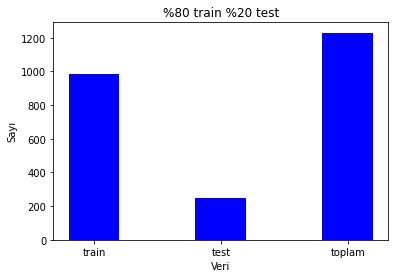

In [ ]:
plt.bar(["train","test","toplam"], [len(train),len(test),toplam], color ='blue', width = 0.4)
plt.xlabel("Veri")
plt.ylabel("Sayı")
plt.title("%80 train %20 test")
plt.show()

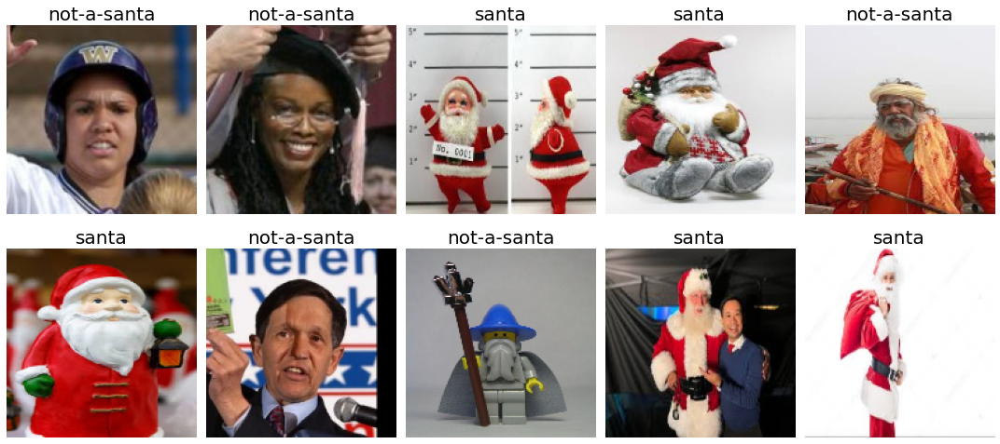

In [ ]:
satir = 2
sutun = 5

fig,ax = plt.subplots(satir, sutun)
fig.set_size_inches(15,7)

for i in range(satir):
    for j in range(sutun):
        l = np.random.randint(0, len(y_train))
        RGB_img = cv2.cvtColor(X_train[l], cv2.COLOR_BGR2RGB)
        ax[i,j].imshow(RGB_img)
        ax[i,j].set_title(CLASSES[y_train[l]], fontsize = 20)
        ax[i,j].axis('off')        
plt.tight_layout()

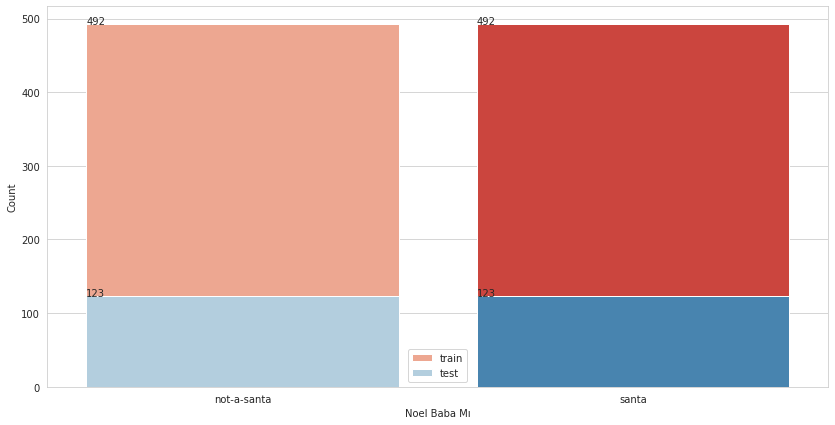

In [ ]:
sns.set_style('whitegrid')
plt.figure(figsize = (14,7))
fig = sns.countplot(x = y_train, palette = "Reds")
fig2 = sns.countplot(x = y_test, palette = "Blues")
fig.set(xticks = range(len(CLASSES)), xticklabels = [i for i in CLASSES])
plt.legend(["train","test"])

plt.xlabel('Noel Baba Mı')
plt.ylabel('Count')

for p in fig.patches:
        fig.annotate('{:.0f}'.format(p.get_height()), (p.get_x(), p.get_height()))
plt.show()


## 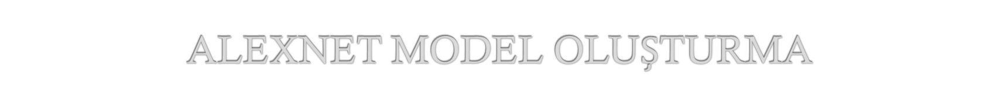




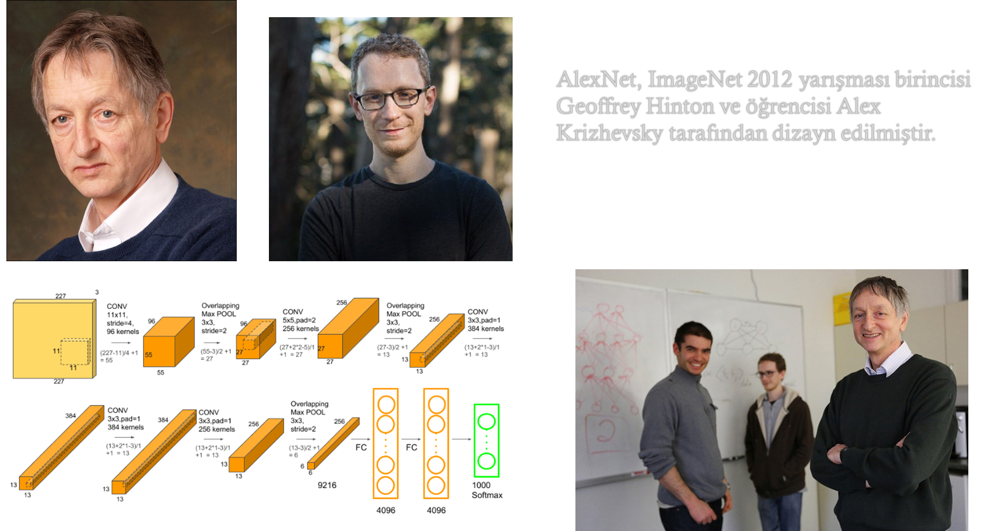


In [ ]:

class AlexNet(Sequential):
    def __init__(self, input_shape, num_classes):
        super().__init__()

        self.add(Conv2D(96, kernel_size=(11,11), strides= 4,
                        padding= 'valid', activation= 'relu',
                        input_shape= input_shape,
                        kernel_initializer= 'he_normal'))
        self.add(MaxPooling2D(pool_size=(3,3), strides= (2,2),
                              padding= 'valid', data_format= None))

        self.add(Conv2D(256, kernel_size=(5,5), strides= 1,
                        padding= 'same', activation= 'relu',
                        kernel_initializer= 'he_normal'))
        self.add(MaxPooling2D(pool_size=(3,3), strides= (2,2),
                              padding= 'valid', data_format= None)) 

        self.add(Conv2D(384, kernel_size=(3,3), strides= 1,
                        padding= 'same', activation= 'relu',
                        kernel_initializer= 'he_normal'))

        self.add(Conv2D(384, kernel_size=(3,3), strides= 1,
                        padding= 'same', activation= 'relu',
                        kernel_initializer= 'he_normal'))

        self.add(Conv2D(256, kernel_size=(3,3), strides= 1,
                        padding= 'same', activation= 'relu',
                        kernel_initializer= 'he_normal'))

        self.add(MaxPooling2D(pool_size=(3,3), strides= (2,2),
                              padding= 'valid', data_format= None))

        self.add(Flatten())
        self.add(Dense(4096, activation= 'relu'))
        self.add(Dense(4096, activation= 'relu'))
        self.add(Dense(1000, activation= 'relu'))
        self.add(Dense(num_classes, activation= 'softmax'))

        self.compile(optimizer= tf.keras.optimizers.Adam(0.001),
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])
        


*   rescale: normalizasyon işlemi
*   horizantal_flip : resmi ters çevirme (yatay)
*   width_shift : verilen değerde resmi rastgele oynatma
*   fill mode:  nearest seçildi fotoğraf değiştiğinde boş kalan pikselleri en yakın piksellerle doldurma


target_size: Size of the input image.

color_mode: Set to rgb for colored images otherwise grayscale if the images are black and white.

batch_size: Size of the batches of data.

class_mode: Set to binary is for 1-D binary labels whereas categorical is for 2-D one-hot encoded labels.




In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, width_shift_range=0.1, height_shift_range=0.1, fill_mode='nearest')
test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
train_generator = train_datagen.flow_from_directory('/content/is that santa/train', target_size=(150, 150), batch_size=32, class_mode='binary')
test_generator = test_datagen.flow_from_directory('/content/is that santa/test', target_size=(150, 150), batch_size=32, class_mode='binary', shuffle= False)

Found 984 images belonging to 2 classes.
Found 246 images belonging to 2 classes.


In [ ]:
model = AlexNet((150, 150, 3), len(CLASSES))

In [ ]:
model.summary()

Model: "alex_net"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 35, 35, 96)        34944     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 17, 17, 96)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 17, 17, 256)       614656    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 8, 8, 256)        0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 8, 8, 384)         885120    
                                                                 
 conv2d_3 (Conv2D)           (None, 8, 8, 384)         132

In [ ]:
#parametre değerlerini kaggle @Marília Prata 'nın Is That Santa çalışmasından aldım.


history = model.fit(train_generator, epochs=25, steps_per_epoch=len(train_generator), validation_data= test_generator, validation_steps=len(test_generator), batch_size= 64)


Epoch 1/25
31/31 [==============================] - 20s 657ms/step - loss: 0.7016 - accuracy: 0.6433 - val_loss: 0.5301 - val_accuracy: 0.7846
Epoch 2/25
31/31 [==============================] - 20s 649ms/step - loss: 0.4407 - accuracy: 0.8161 - val_loss: 0.4433 - val_accuracy: 0.7724
Epoch 3/25
31/31 [==============================] - 20s 661ms/step - loss: 0.3670 - accuracy: 0.8557 - val_loss: 0.3491 - val_accuracy: 0.8455
Epoch 4/25
31/31 [==============================] - 20s 653ms/step - loss: 0.3592 - accuracy: 0.8567 - val_loss: 0.3950 - val_accuracy: 0.8496
Epoch 5/25
31/31 [==============================] - 20s 649ms/step - loss: 0.3247 - accuracy: 0.8689 - val_loss: 0.3702 - val_accuracy: 0.8455
Epoch 6/25
31/31 [==============================] - 20s 654ms/step - loss: 0.2843 - accuracy: 0.8791 - val_loss: 0.2932 - val_accuracy: 0.8780
Epoch 7/25
31/31 [==============================] - 20s 621ms/step - loss: 0.2845 - accuracy: 0.8821 - val_loss: 0.4102 - val_accuracy: 0.8374

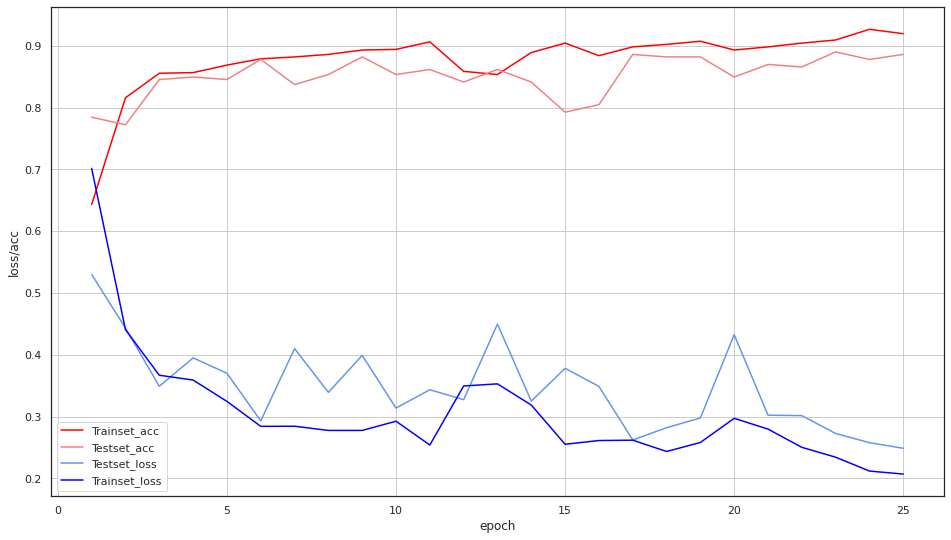

In [ ]:

sns.set(rc={'figure.figsize':(16, 9)})
sns.set_style("white")

acc= history.history['accuracy']
val_acc= history.history['val_accuracy']
y_vloss = history.history['val_loss']
y_loss = history.history['loss']

x_len = np.arange(len(y_loss))
plt.plot(x_len+1, acc, c="red", label='Trainset_acc')
plt.plot(x_len+1, val_acc, c="lightcoral", label='Testset_acc')
plt.plot(x_len+1, y_vloss, c="cornflowerblue", label='Testset_loss')
plt.plot(x_len+1, y_loss, c="blue", label='Trainset_loss')

plt.legend(loc='lower left')
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss/acc')
plt.show()

Olasılık:  0.9999517
Tahmin: santa


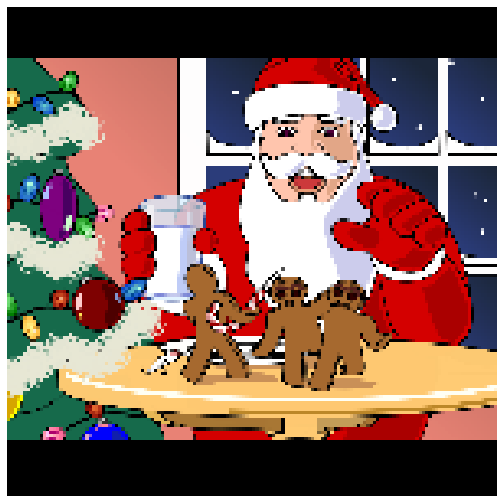

In [ ]:
from keras.preprocessing import image

labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())

ImagePath='/content/is that santa/test/santa/301.Santa.jpg'
img = image.load_img(ImagePath, target_size=(150, 150))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= model.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: %{}",np.max(p[0], axis=-1))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)

Olasılık:  0.99990416
Tahmin: not-a-santa


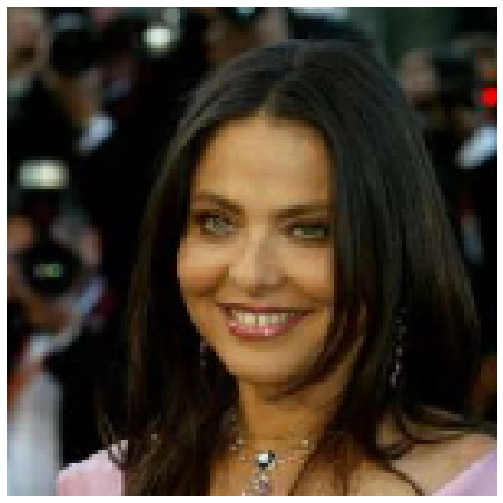

In [ ]:

labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())

ImagePath='/content/is that santa/test/not-a-santa/107.not-a-santa.jpg'
img = image.load_img(ImagePath, target_size=(150, 150))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= model.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: ",np.max(p[0], axis=-1))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)



Olasılık:  0.9550228
Tahmin: santa


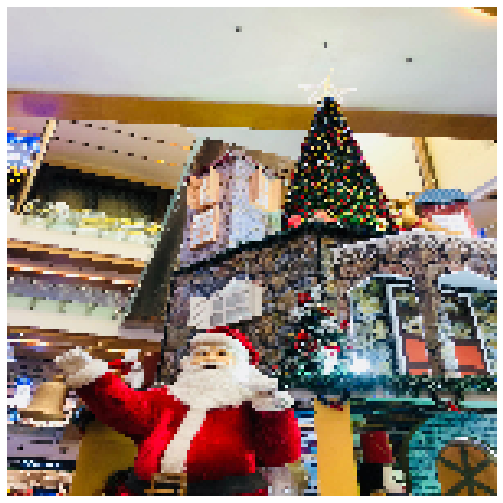

In [ ]:
labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())

ImagePath='/content/is that santa/test/santa/520.Santa.jpg'
img = image.load_img(ImagePath, target_size=(150, 150))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= model.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: ",np.max(p[0], axis=-1))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)

Olasılık:  0.9161731
Tahmin: santa


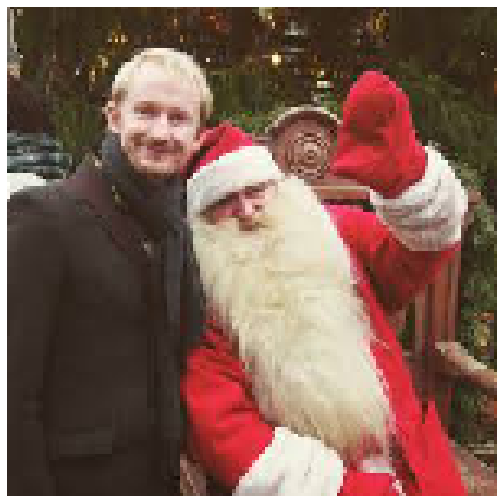

In [ ]:

labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())

ImagePath='/content/is that santa/test/santa/139.Santa.jpg'
img = image.load_img(ImagePath, target_size=(150, 150))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= model.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: ",np.max(p[0], axis=-1))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)




Olasılık:  0.71685064
Tahmin: not-a-santa


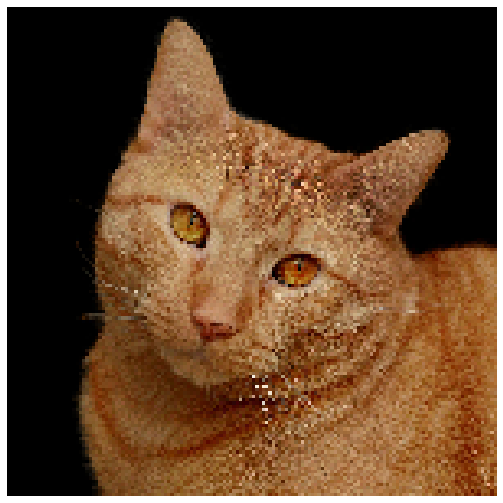

In [ ]:

labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())

ImagePath='/content/is that santa/test/not-a-santa/0.not-a-santa.jpg'
img = image.load_img(ImagePath, target_size=(150, 150))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= model.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: ",np.max(p[0], axis=-1))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)



**Aşağıda internetten rastgele noel baba fotoğrafları denedim.**

Olasılık:  0.98836434
Tahmin: santa


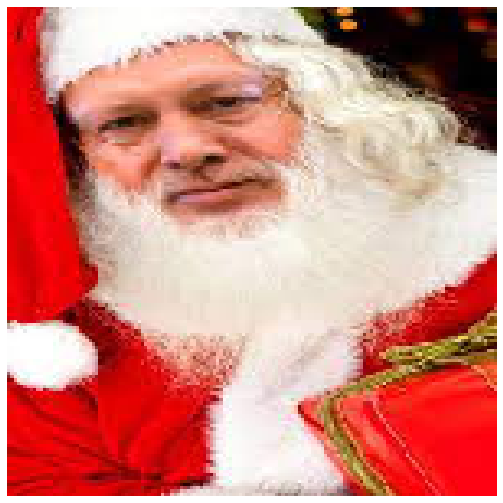

In [ ]:


labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())

ImagePath='/content/drive/MyDrive/indir.jpg'
img = image.load_img(ImagePath, target_size=(150, 150))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= model.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: ",np.max(p[0], axis=-1))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)


Olasılık:  0.8546972
Tahmin: santa


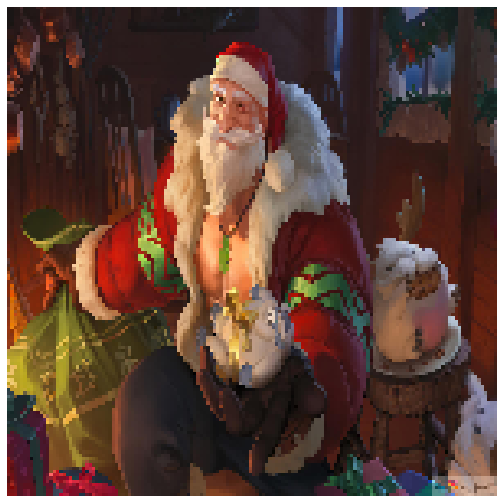

In [ ]:


labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())

ImagePath='/content/drive/MyDrive/noel-baba-braum-efsaneler-ligi-lol-duvar-kagidi-2880x1800_8.jpg'
img = image.load_img(ImagePath, target_size=(150, 150))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= model.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: ",np.max(p[0], axis=-1))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)



---
Confusion Matrix


In [ ]:

def plot_confusion_matrix(cm, classes, normalize=True, title='Confusion matrix', cmap=plt.cm.Blues):

    """

    This function prints and plots the confusion matrix.

    Normalization can be applied by setting `normalize=True`.

    """

    plt.figure(figsize=(10,10))



    plt.imshow(cm, interpolation='nearest', cmap=cmap)

    plt.title(title)

    plt.colorbar()



    tick_marks = np.arange(len(classes))

    plt.xticks(tick_marks, classes, rotation=45)

    plt.yticks(tick_marks, classes)



    if normalize:

        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]

        cm = np.around(cm, decimals=2)

        cm[np.isnan(cm)] = 0.0

        print("Normalized confusion matrix")

    else:

        print('Confusion matrix, without normalization')

    thresh = cm.max() / 2.

    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):

        plt.text(j, i, cm[i, j],

                 horizontalalignment="center",

                 color="white" if cm[i, j] > thresh else "black")

    plt.tight_layout()

    plt.ylabel('Doğrular')

    plt.xlabel('Tahminlenen')

In [ ]:
target_names = []

for key in train_generator.class_indices:

    target_names.append(key)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  This is separate from the ipykernel package so we can avoid doing imports until


Confusion Matrix
Normalized confusion matrix


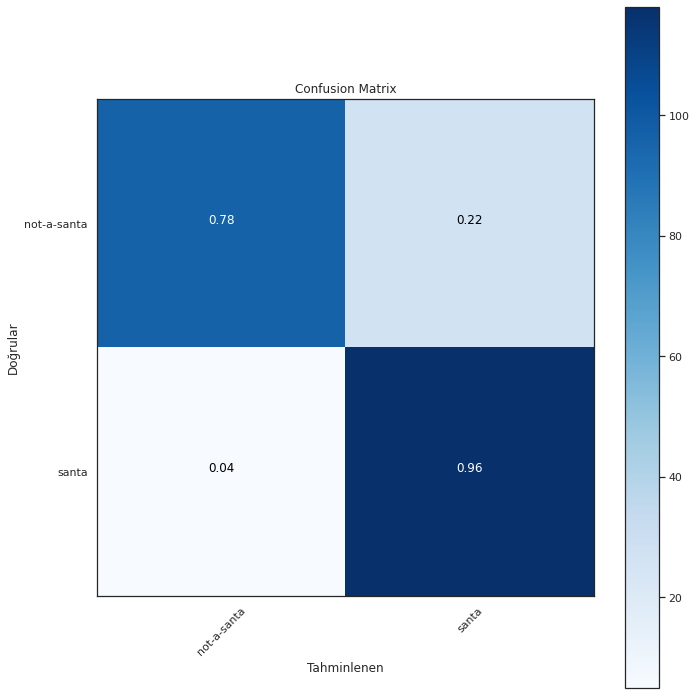

In [ ]:
import itertools    

Y_pred = model.predict_generator(test_generator)

y_pred = np.argmax(Y_pred, axis=1)

print('Confusion Matrix')

cm = confusion_matrix(test_generator.classes, y_pred)

plot_confusion_matrix(cm, target_names, title='Confusion Matrix')

## 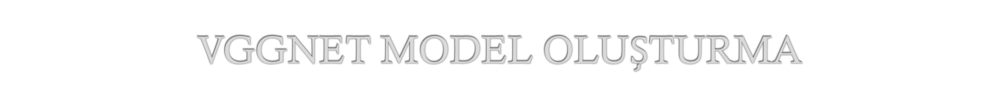

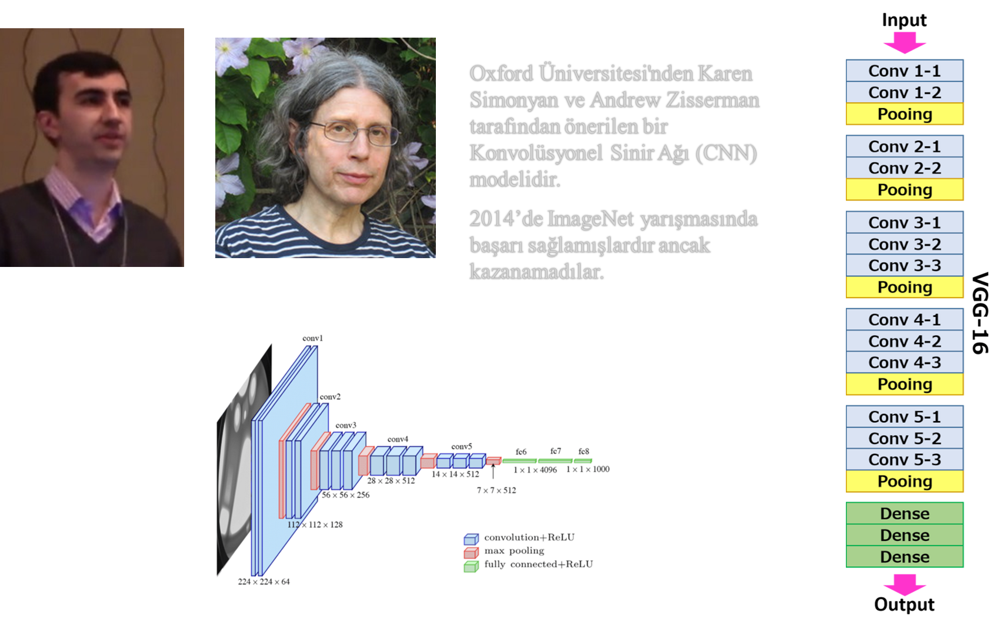

In [ ]:

class VggNet(Sequential):
    def __init__(self, input_shape):
        super().__init__()

        self.add(Conv2D(filters=64, kernel_size=(3,3),
                        padding= 'same', activation= 'relu',
                        input_shape= input_shape))
        self.add(Conv2D(filters=64, kernel_size=(3,3),
                        padding= 'same', activation= 'relu',))
        self.add(MaxPooling2D(pool_size=(2,2)))

        self.add(Conv2D(filters=128, kernel_size=(3,3),
                        padding= 'same', activation= 'relu',))
        self.add(Conv2D(filters=128, kernel_size=(3,3),
                        padding= 'same', activation= 'relu',))
        self.add(MaxPooling2D(pool_size=(2,2)))

        self.add(Conv2D(filters=256, kernel_size=(3,3),
                        padding= 'same', activation= 'relu',))
        self.add(Conv2D(filters=256, kernel_size=(3,3),
                        padding= 'same', activation= 'relu',))
        self.add(Conv2D(filters=256, kernel_size=(3,3),
                        padding= 'same', activation= 'relu',))
        self.add(MaxPooling2D(pool_size=(2,2)))

        self.add(Conv2D(filters=512, kernel_size=(3,3),
                        padding= 'same', activation= 'relu',))
        self.add(Conv2D(filters=512, kernel_size=(3,3),
                        padding= 'same', activation= 'relu',))
        self.add(Conv2D(filters=512, kernel_size=(3,3),
                        padding= 'same', activation= 'relu',))
        self.add(MaxPooling2D(pool_size=(2,2)))

        self.add(Conv2D(filters=512, kernel_size=(3,3),
                        padding= 'same', activation= 'relu',))
        self.add(Conv2D(filters=512, kernel_size=(3,3),
                        padding= 'same', activation= 'relu',))
        self.add(Conv2D(filters=512, kernel_size=(3,3),
                        padding= 'same', activation= 'relu',))
        self.add(MaxPooling2D(pool_size=(2,2)))

        self.add(Flatten())
        self.add(Dense(4096, activation= 'relu'))
        self.add(Dense(4096, activation= 'relu'))
        self.add(Dropout(0.5))
        self.add(Dense(1000, activation= 'relu'))
        self.add(Dropout(0.5))
        self.add(Dense(2, activation= 'softmax'))

        self.compile(optimizer= tf.keras.optimizers.Adam(0.0001),
                    loss='sparse_categorical_crossentropy',
                    metrics=['accuracy'])

In [ ]:
model2 = VggNet((224, 224, 3))

In [ ]:
model2.summary()

Model: "vgg_net"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 224, 224, 64)      1792      
                                                                 
 conv2d_1 (Conv2D)           (None, 224, 224, 64)      36928     
                                                                 
 max_pooling2d (MaxPooling2D  (None, 112, 112, 64)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 112, 112, 128)     73856     
                                                                 
 conv2d_3 (Conv2D)           (None, 112, 112, 128)     147584    
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 56, 56, 128)      0         
 2D)                                                       

In [ ]:
train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, width_shift_range=0.1, height_shift_range=0.1, fill_mode='nearest')


test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
train_generator = train_datagen.flow_from_directory('/content/is that santa/train', target_size=(224, 224), batch_size=32, class_mode='binary')

test_generator = test_datagen.flow_from_directory('/content/is that santa/test', target_size=(224, 224), batch_size=32, class_mode='binary', shuffle= False)

Found 984 images belonging to 2 classes.
Found 246 images belonging to 2 classes.


In [ ]:
history2 = model2.fit(train_generator, epochs=40, steps_per_epoch=len(train_generator), validation_data= test_generator, validation_steps=len(test_generator), batch_size= 64)

Epoch 1/40
31/31 [==============================] - 48s 1s/step - loss: 0.4796 - accuracy: 0.8140 - val_loss: 0.4548 - val_accuracy: 0.8252
Epoch 2/40
31/31 [==============================] - 38s 1s/step - loss: 0.3694 - accuracy: 0.8557 - val_loss: 0.3514 - val_accuracy: 0.8699
Epoch 3/40
31/31 [==============================] - 39s 1s/step - loss: 0.2918 - accuracy: 0.8862 - val_loss: 0.3154 - val_accuracy: 0.8780
Epoch 4/40
31/31 [==============================] - 38s 1s/step - loss: 0.2709 - accuracy: 0.8913 - val_loss: 0.2983 - val_accuracy: 0.8862
Epoch 5/40
31/31 [==============================] - 38s 1s/step - loss: 0.2762 - accuracy: 0.9024 - val_loss: 0.2926 - val_accuracy: 0.8821
Epoch 6/40
31/31 [==============================] - 38s 1s/step - loss: 0.2795 - accuracy: 0.8953 - val_loss: 0.2954 - val_accuracy: 0.8902
Epoch 7/40
31/31 [==============================] - 38s 1s/step - loss: 0.2434 - accuracy: 0.9146 - val_loss: 0.2636 - val_accuracy: 0.8943
Epoch 8/40
31/31 [==

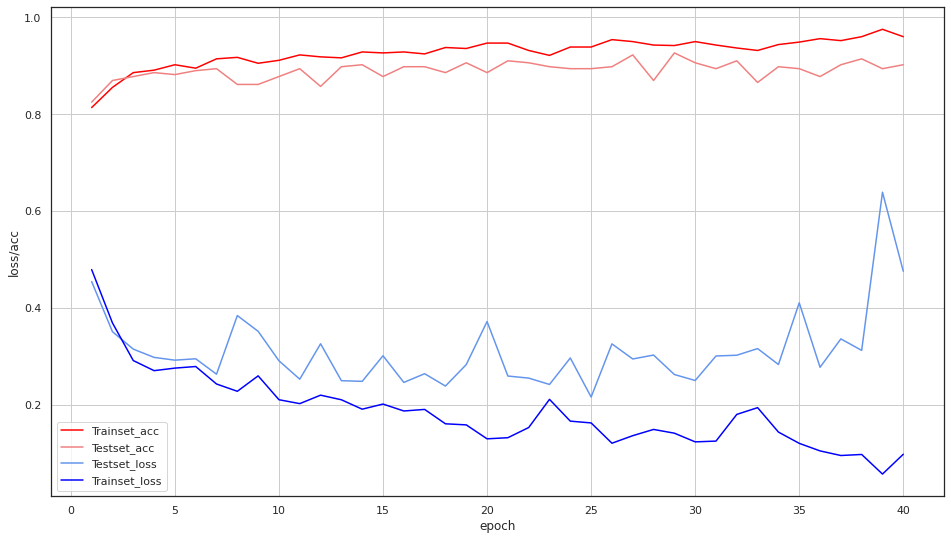

In [ ]:
sns.set(rc={'figure.figsize':(16, 9)})
sns.set_style("white")

acc= history2.history['accuracy']
val_acc= history2.history['val_accuracy']
y_vloss = history2.history['val_loss']
y_loss = history2.history['loss']

x_len = np.arange(len(y_loss))
plt.plot(x_len+1, acc, c="red", label='Trainset_acc')
plt.plot(x_len+1, val_acc, c="lightcoral", label='Testset_acc')
plt.plot(x_len+1, y_vloss, c="cornflowerblue", label='Testset_loss')
plt.plot(x_len+1, y_loss, c="blue", label='Trainset_loss')

plt.legend(loc='lower left')
plt.grid()
plt.xlabel('epoch')
plt.ylabel('loss/acc')
plt.show()

ALEXNET modeli kullanarak yaptığımız örnekleri şimdi VGGNET modeli ile deniyoruz ve sonuçlarda dramatik bir artış gözlemledik.

Olasılık:  1.0
Tahmin: santa


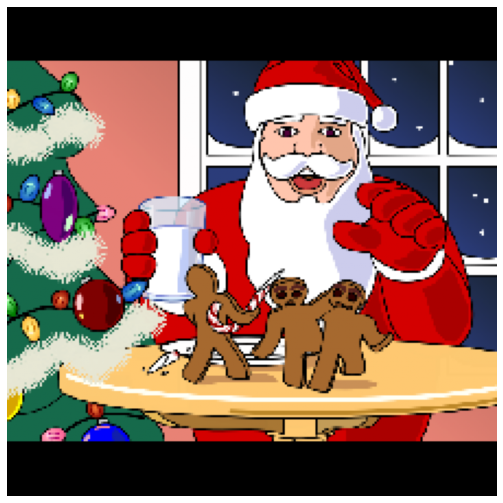

In [ ]:
from keras.preprocessing import image

labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())

ImagePath='/content/is that santa/test/santa/301.Santa.jpg'
img = image.load_img(ImagePath, target_size=(224, 224))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= model2.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: ",np.max(p[0], axis=-1))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)

Olasılık:  0.9891711
Tahmin: not-a-santa


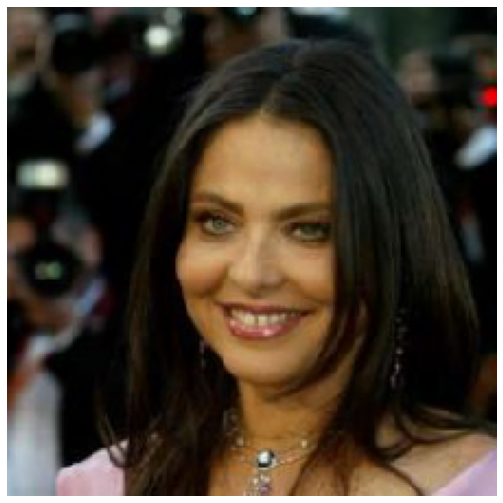

In [ ]:

labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())

ImagePath='/content/is that santa/test/not-a-santa/107.not-a-santa.jpg'
img = image.load_img(ImagePath, target_size=(224, 224))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= model2.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: ",np.max(p[0], axis=-1))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)

Olasılık:  0.9931826
Tahmin: santa


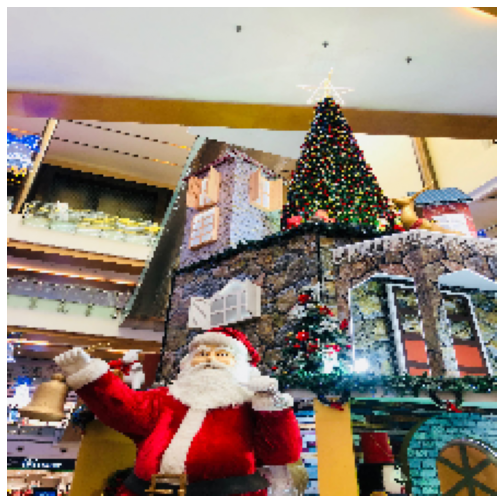

In [ ]:
labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())

ImagePath='/content/is that santa/test/santa/520.Santa.jpg'
img = image.load_img(ImagePath, target_size=(224, 224))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= model2.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: ",np.max(p[0], axis=-1))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)

Olasılık:  0.99770784
Tahmin: santa


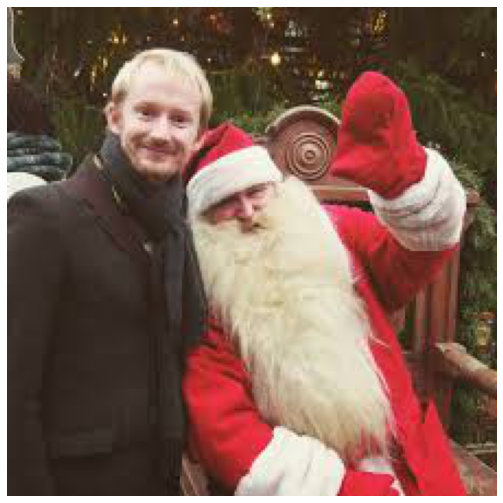

In [ ]:

labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())

ImagePath='/content/is that santa/test/santa/139.Santa.jpg'
img = image.load_img(ImagePath, target_size=(224, 224))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= model2.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: ",np.max(p[0], axis=-1))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)


Olasılık:  0.9977975
Tahmin: not-a-santa


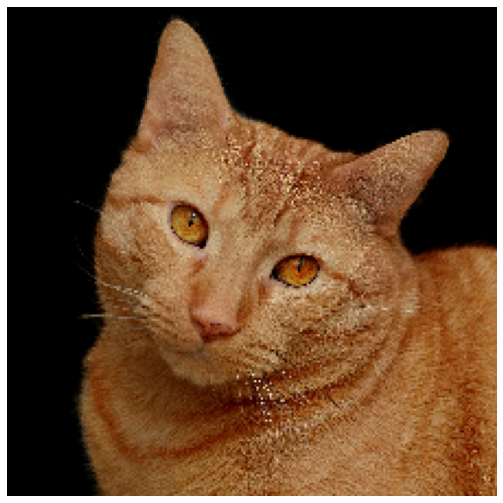

In [ ]:

labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())

ImagePath='/content/is that santa/test/not-a-santa/0.not-a-santa.jpg'
img = image.load_img(ImagePath, target_size=(224, 224))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= model2.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: ",np.max(p[0], axis=-1))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)


In [ ]:
target_names = []

for key in train_generator.class_indices:

    target_names.append(key)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: UserWarning: `Model.predict_generator` is deprecated and will be removed in a future version. Please use `Model.predict`, which supports generators.
  This is separate from the ipykernel package so we can avoid doing imports until


Confusion Matrix
Normalized confusion matrix


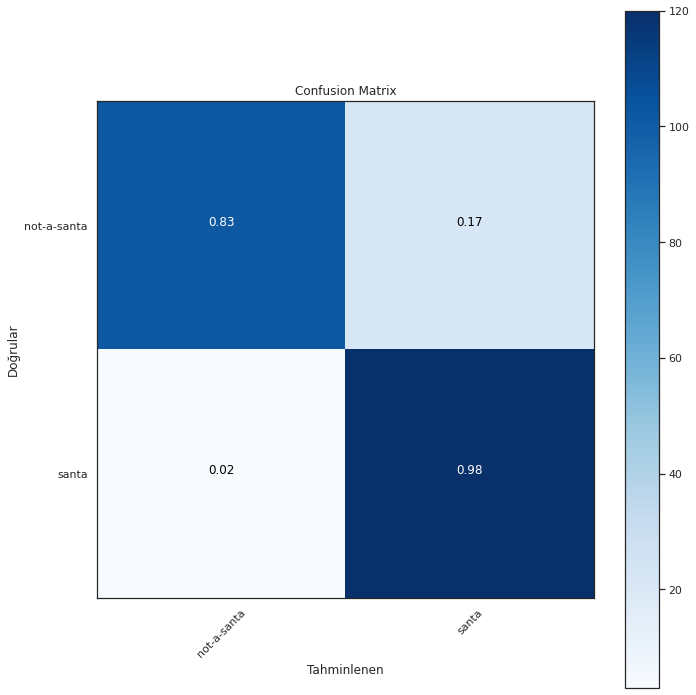

In [ ]:
import itertools    

Y_pred = model2.predict_generator(test_generator)

y_pred = np.argmax(Y_pred, axis=1)

print('Confusion Matrix')

cm = confusion_matrix(test_generator.classes, y_pred)

plot_confusion_matrix(cm, target_names, title='Confusion Matrix')

## 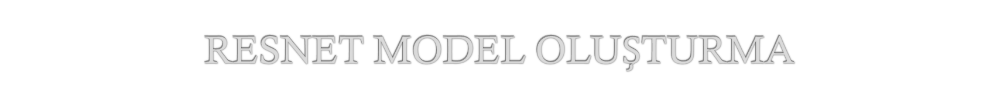

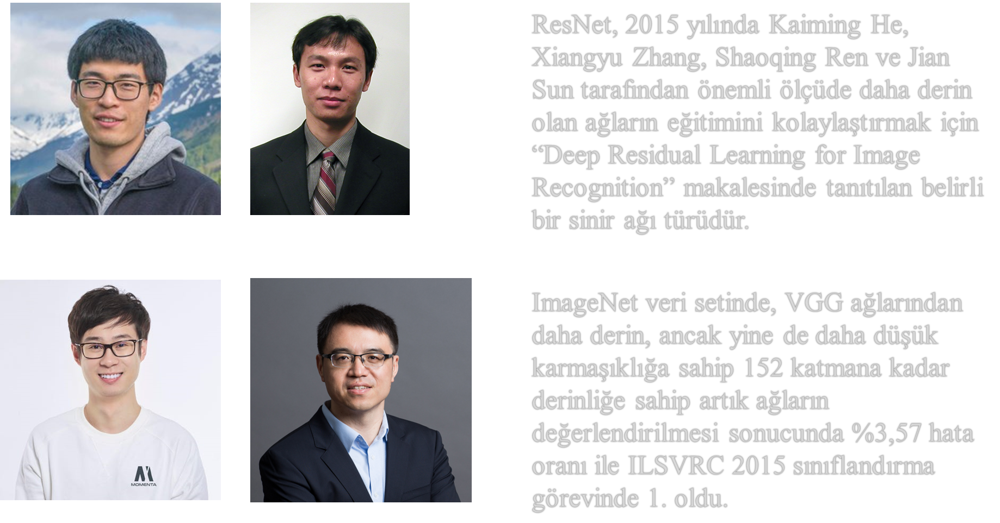



---

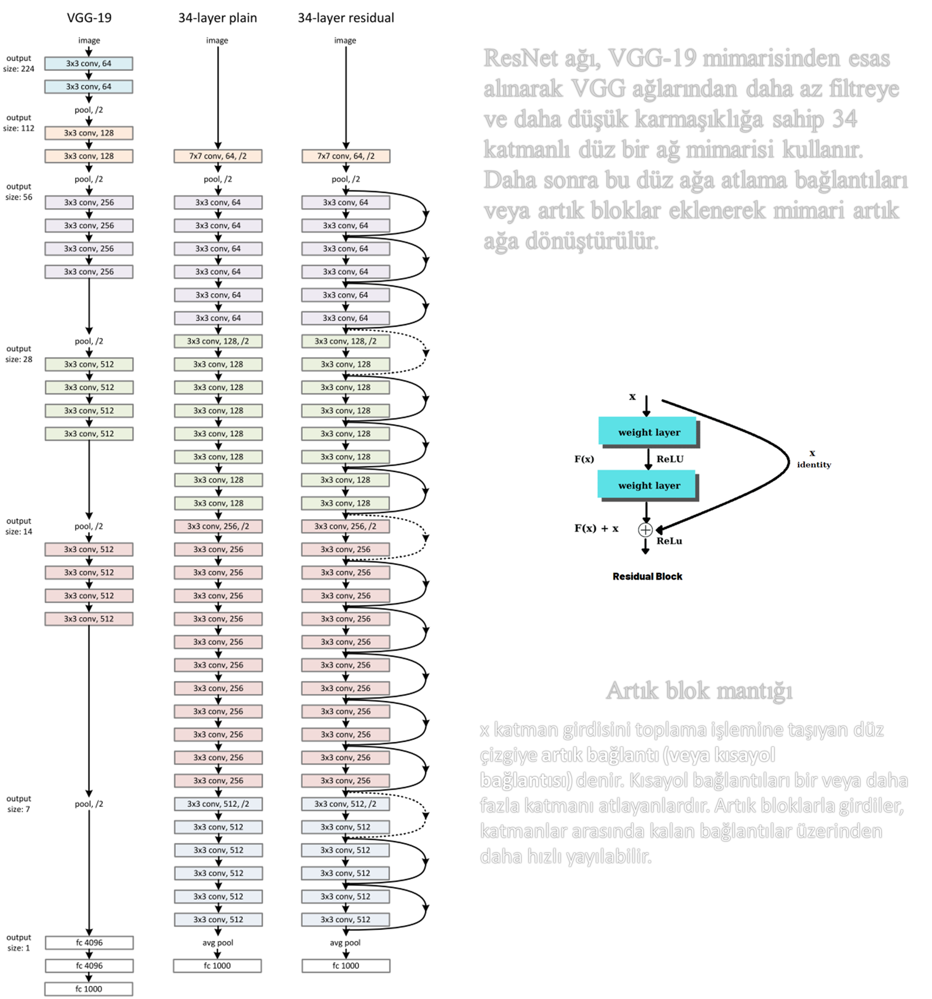

In [ ]:
from tensorflow import keras

from keras.applications.resnet import ResNet50
from keras.utils.vis_utils import plot_model

from glob import glob #pythonun belirli bir klasör içindeki dosyaları listelemimze yardımcı olan modül
from keras.models import Model
from keras.layers import Flatten,Dense,Dropout,Softmax,BatchNormalization

In [ ]:

train_datagen = ImageDataGenerator(rescale=1./255, horizontal_flip=True, width_shift_range=0.1, height_shift_range=0.1, fill_mode='nearest')

test_datagen = ImageDataGenerator(rescale=1./255)

In [ ]:
train_generator = train_datagen.flow_from_directory('/content/is that santa/train', target_size=(224, 224), batch_size=32, class_mode='binary')

test_generator = test_datagen.flow_from_directory('/content/is that santa/test', target_size=(224, 224), batch_size=32, class_mode='binary', shuffle= False)

Found 984 images belonging to 2 classes.
Found 246 images belonging to 2 classes.


In [ ]:
modelR = Sequential()

In [ ]:
modelR.add(ResNet50(include_top = False, pooling = "avg", weights = "imagenet"))

In [ ]:
modelR.add(Flatten())
modelR.add(BatchNormalization())

modelR.add(Dense(2048, activation = "relu"))
modelR.add(BatchNormalization())
modelR.add(Dense(1024, activation = "relu"))
modelR.add(BatchNormalization())
modelR.add(Dense(2, activation = "softmax"))

In [ ]:
modelR.layers[0].trainable = False

In [ ]:
modelR.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [ ]:
modelR.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 batch_normalization (BatchN  (None, 2048)             8192      
 ormalization)                                                   
                                                                 
 dense (Dense)               (None, 2048)              4196352   
                                                                 
 batch_normalization_1 (Batc  (None, 2048)             8192      
 hNormalization)                                                 
                                                                 
 dense_1 (Dense)             (None, 1024)              2

In [ ]:
hist = modelR.fit(train_generator, epochs=100, steps_per_epoch=len(train_generator), validation_data= test_generator, validation_steps=len(test_generator), batch_size= 128)

Epoch 1/100
31/31 [==============================] - 32s 802ms/step - loss: 0.9641 - accuracy: 0.8059 - val_loss: 0.8730 - val_accuracy: 0.6423
Epoch 2/100
31/31 [==============================] - 24s 773ms/step - loss: 0.4249 - accuracy: 0.8313 - val_loss: 0.8891 - val_accuracy: 0.5650
Epoch 3/100
31/31 [==============================] - 24s 756ms/step - loss: 0.3404 - accuracy: 0.8608 - val_loss: 0.8763 - val_accuracy: 0.5000
Epoch 4/100
31/31 [==============================] - 24s 782ms/step - loss: 0.2797 - accuracy: 0.8852 - val_loss: 0.5066 - val_accuracy: 0.7398
Epoch 5/100
31/31 [==============================] - 24s 772ms/step - loss: 0.3017 - accuracy: 0.8750 - val_loss: 0.4203 - val_accuracy: 0.8699
Epoch 6/100
31/31 [==============================] - 23s 755ms/step - loss: 0.3440 - accuracy: 0.8587 - val_loss: 0.4227 - val_accuracy: 0.8374
Epoch 7/100
31/31 [==============================] - 24s 762ms/step - loss: 0.2461 - accuracy: 0.8913 - val_loss: 0.4386 - val_accuracy:

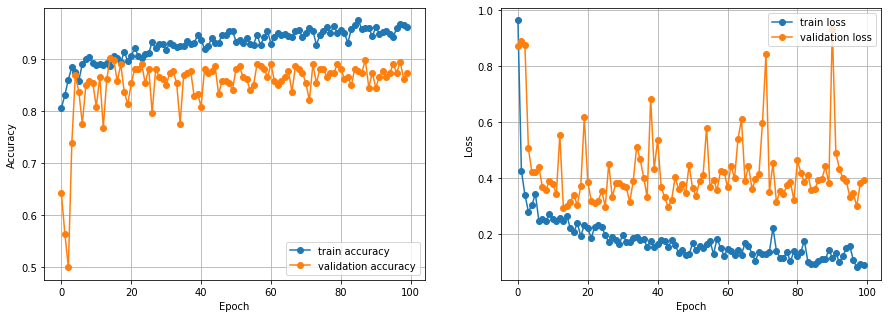

In [ ]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist.history['accuracy'], 'o-', label='train accuracy')
plt.plot(hist.history['val_accuracy'], 'o-', label = 'validation accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.grid(True)
plt.legend(loc='lower right')

plt.subplot(1,2,2)
plt.plot(hist.history['loss'], 'o-', label='train loss')
plt.plot(hist.history['val_loss'], 'o-', label='validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.grid(True)
plt.legend(loc='upper right')

plt.show()

Olasılık: %99.99249
Tahmin: santa


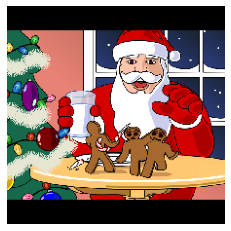

In [ ]:
from keras.preprocessing import image

labels = train_generator.class_indices
labels = dict((v,k) for k,v in labels.items())

ImagePath='/content/is that santa/test/santa/301.Santa.jpg'
img = image.load_img(ImagePath, target_size=(224, 224))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= modelR.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: %{0:.5f}".format((np.max(p[0], axis=-1)*100)))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)

Olasılık: %99.57320
Tahmin: not-a-santa


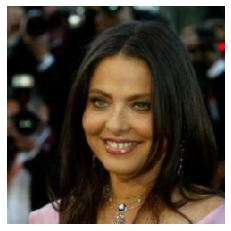

In [ ]:
ImagePath='/content/is that santa/test/not-a-santa/107.not-a-santa.jpg'
img = image.load_img(ImagePath, target_size=(224, 224))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= modelR.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: %{0:.5f}".format((np.max(p[0], axis=-1)*100)))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)

Olasılık: %98.02678
Tahmin: santa


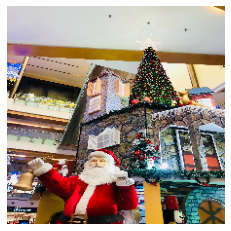

In [ ]:
ImagePath='/content/is that santa/test/santa/520.Santa.jpg'
img = image.load_img(ImagePath, target_size=(224, 224))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= modelR.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
#print("Predicted shape",p.shape)
print("Olasılık: %{0:.5f}".format((np.max(p[0], axis=-1)*100)))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)

Olasılık: %95.14301
Tahmin: not-a-santa


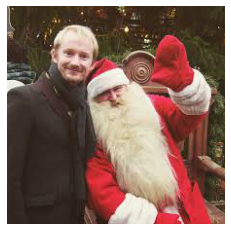

In [ ]:
ImagePath='/content/is that santa/test/santa/139.Santa.jpg'
img = image.load_img(ImagePath, target_size=(224, 224))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= modelR.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: %{0:.5f}".format((np.max(p[0], axis=-1)*100)))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)

Olasılık: %67.54476
Tahmin: not-a-santa


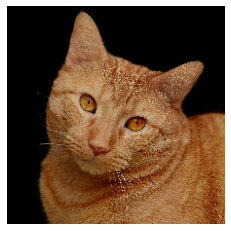

In [ ]:
ImagePath='/content/is that santa/test/not-a-santa/0.not-a-santa.jpg'
img = image.load_img(ImagePath, target_size=(224, 224))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= modelR.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: %{0:.5f}".format((np.max(p[0], axis=-1)*100)))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)

Olasılık: %53.60413
Tahmin: santa


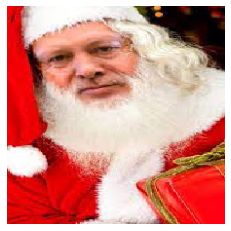

In [ ]:
ImagePath='/content/drive/MyDrive/indir.jpg'
img = image.load_img(ImagePath, target_size=(224, 224))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= modelR.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: %{0:.5f}".format((np.max(p[0], axis=-1)*100)))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)

Olasılık: %63.10061
Tahmin: santa


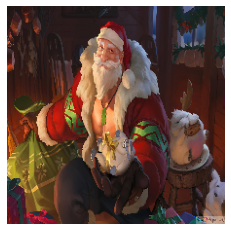

In [ ]:

ImagePath='/content/drive/MyDrive/noel-baba-braum-efsaneler-ligi-lol-duvar-kagidi-2880x1800_8.jpg'
img = image.load_img(ImagePath, target_size=(224, 224))
img = image.img_to_array(img, dtype=np.uint8)
img=np.array(img)/255.0


plt.axis('off')
plt.imshow(img.squeeze())

p= modelR.predict(img[np.newaxis, ...])

#print("Predicted shape",p.shape)
print("Olasılık: %{0:.5f}".format((np.max(p[0], axis=-1)*100)))
predicted_class = labels[np.argmax(p[0], axis=-1)]
print("Tahmin:",predicted_class)

## 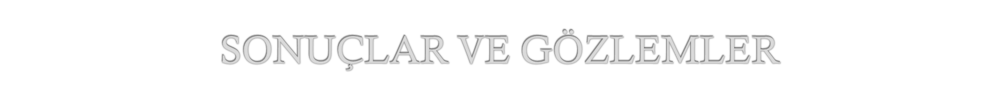

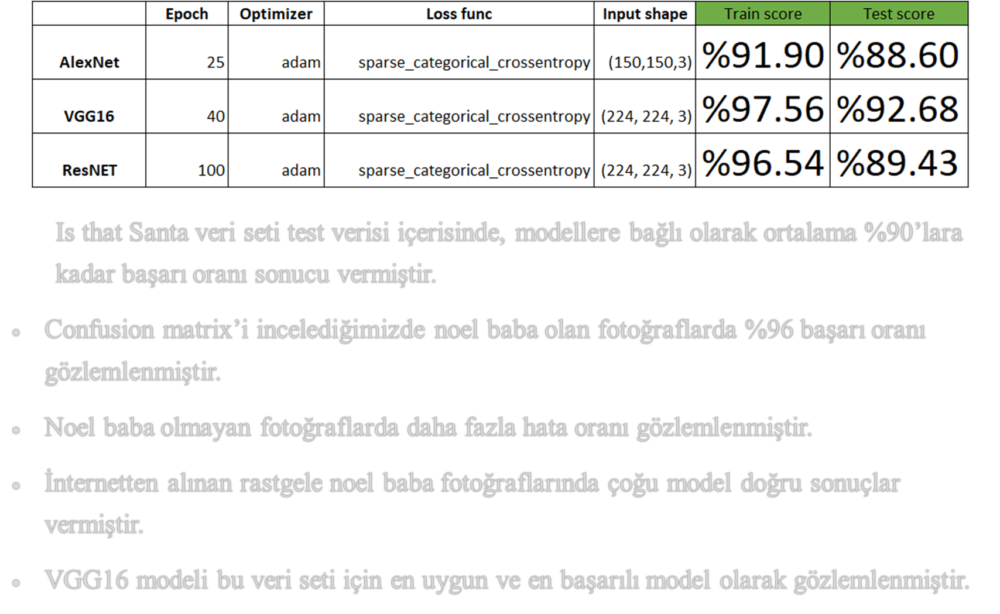



---


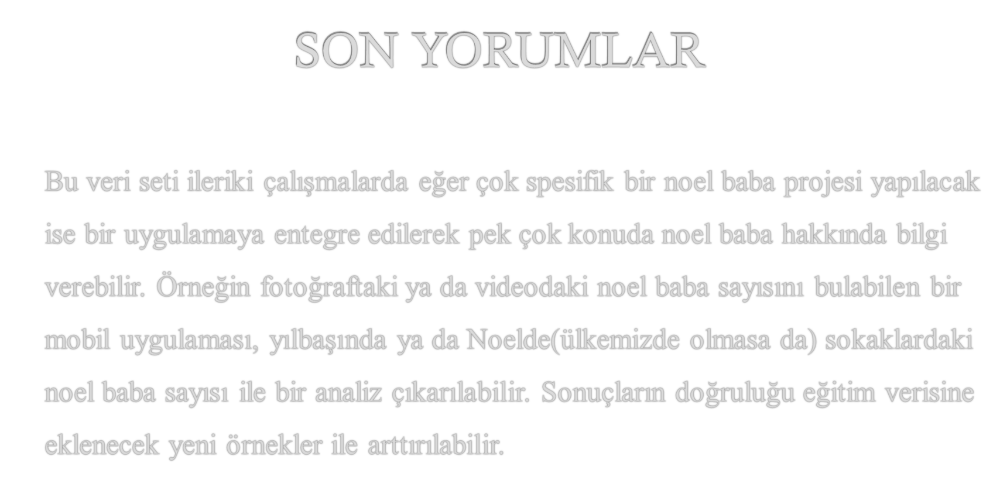



---

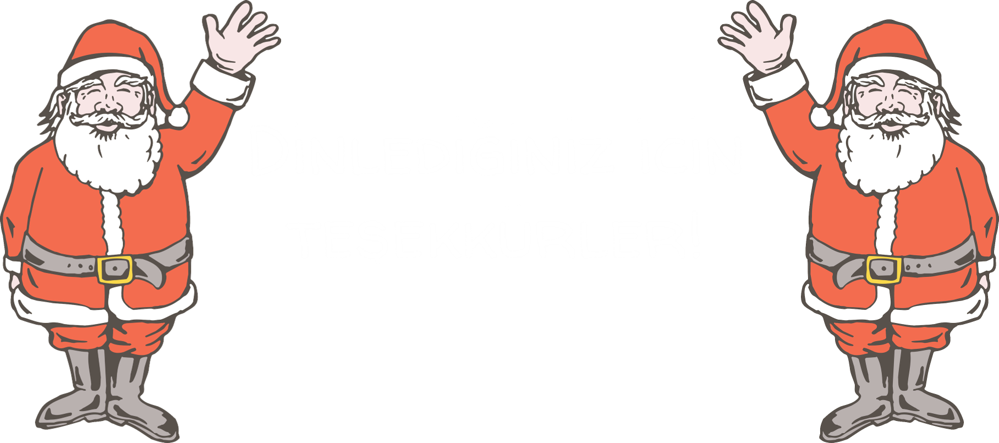